Compare predictions of VIC-GRU (trained on 2010-2012, 2010 being warm-up period) with XGBoost and ridge regression (trained on 2010-2012)

In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../..')
import pandas as pd
import numpy as np
import hydroeval
from src import load_data, evaluate
import netCDF4 as nc
import pickle
from matplotlib import pyplot as plt
from matplotlib import dates
import datetime as dt

In [2]:
vic_predictions = pd.read_csv('../../data/GRIP-E_Hydrographs_VIC-GRU_test2013+2014_allStations.csv').drop(['time', 'hour', 'precip [mm/day]'], axis=1)
subid2gauge = pd.read_csv('../../data/VIC-GRU_subid2gauge.csv')[['SubId', 'ID']].set_index('SubId')

vic_predictions = vic_predictions.rename(lambda c: subid2gauge.loc[int(c[3:6])].values[0] if c not in ['date', 'hour', 'precip [mm/day]'] else c, axis=1)
vic_predictions = vic_predictions.set_index('date').transpose().unstack().reset_index().rename({'level_0': 'date', 'level_1': 'station', 0: 'vic_prediction'}, axis=1)
vic_predictions['date'] = pd.to_datetime(vic_predictions['date']) - dt.timedelta(days=1)


In [3]:
lstm_file = '20190904-221524'
lstm_predictions = pickle.load(open('../../pickle/results/LSTM_VIC_{}.pkl'.format(lstm_file),'rb'))
lstm_predictions = lstm_predictions.drop(['actual'], axis=1).rename({'prediction': 'lstm_prediction'}, axis=1)

In [4]:
lstmone_file = '20190905-102708'
lstmone_predictions = pickle.load(open('../../pickle/results/LSTM_VIC-oneModel_{}.pkl'.format(lstmone_file),'rb'))
lstmone_predictions = lstmone_predictions.drop(['actual'], axis=1).rename({'prediction': 'lstmone_prediction'}, axis=1)

In [5]:
convlstm_file = '20190905-115932'
convlstm_predictions = pickle.load(open('../../pickle/results/ConvLSTM_withLandcover_{}.pkl'.format(convlstm_file),'rb'))
convlstm_predictions = convlstm_predictions.drop(['actual'], axis=1).rename({'prediction': 'convlstm_prediction'}, axis=1)

In [6]:
xgb_file = '20190706-082538'
xgb_predictions = pickle.load(open('../../pickle/results/XGBoost_VIC_aggregateForcings_{}.pkl'.format(xgb_file),'rb'))
xgb_predictions = xgb_predictions.drop(['actual'], axis=1).rename({'prediction': 'xgb_prediction'}, axis=1)

In [7]:
xgbone_file = '20190908-081744'
xgbone_predictions = pickle.load(open('../../pickle/results/XGBoost_VIC_aggregateForcings_oneModel_{}.pkl'.format(xgbone_file),'rb'))
xgbone_predictions = xgbone_predictions.drop(['actual'], axis=1).rename({'prediction': 'xgbone_prediction'}, axis=1)

In [8]:
lin_file = '20190708-091424'
lin_predictions = pickle.load(open('../../pickle/results/LinReg_VIC_aggregateForcings_{}.pkl'.format(lin_file),'rb'))
lin_predictions = lin_predictions.drop(['actual'], axis=1).rename({'prediction': 'lin_prediction'}, axis=1)

In [9]:
ground_truth = load_data.load_discharge_gr4j_vic()
ground_truth = ground_truth[~pd.isna(ground_truth['runoff'])]

In [10]:
data = pd.merge(ground_truth, vic_predictions, on=['date', 'station'])
data = pd.merge(data, lin_predictions, on=['date', 'station'])
data = pd.merge(data, xgb_predictions, on=['date', 'station'])
data = pd.merge(data, xgbone_predictions, on=['date', 'station'])
data = pd.merge(data, lstm_predictions, on=['date', 'station'])
data = pd.merge(data, lstmone_predictions, on=['date', 'station'])
data = pd.merge(data, convlstm_predictions, on=['date', 'station'])
data = data[(data['date'] > '2012-12-31') & (data['date'] < '2015-01-01')]

/home/mgauch/miniconda3/envs/gwf/lib/python3.7/site-packages/pandas/plotting/_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
../../src/evaluate.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(17,4))
../../src/evaluate.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained unt

XGB outperforms LSTM in 40 of the stations by 0.3774000404911144 on average
XGB almost outperforms LSTM in 45 of the stations (tol 0.07)
VIC Median NSE (clipped to 0) 0.32827190435178966 / Min -6.301638840616013 / Max 0.5972614332012951
XGB Median NSE (clipped to 0) 0.5222957762280172 / Min -0.20600531332203498 / Max 0.666221324763711
XGB-oneModel Median NSE (clipped to 0) 0.4934337194476772 / Min 0.2068427768260137 / Max 0.6602733153925534
LIN Median NSE (clipped to 0) 0.37990824204466384 / Min -1.6766047081809439 / Max 0.5845953217295347
LSTM Median NSE (clipped to 0) 0.12444106504521157 / Min -0.6781941902769908 / Max 0.3979581659146688
LSTM-oneModel Median NSE (clipped to 0) 0.1800957638441691 / Min -0.32182912777066575 / Max 0.31392503455299814
ConvLSTM Median NSE (clipped to 0) 0.4265476898484704 / Min -0.2031954676437815 / Max 0.5966293638207844
VIC Median MSE (clipped to 0) 116.95923758291275 / Min 12.921209491749757 / Max 28514.19228840315
XGB Median MSE (clipped to 0) 96.8212

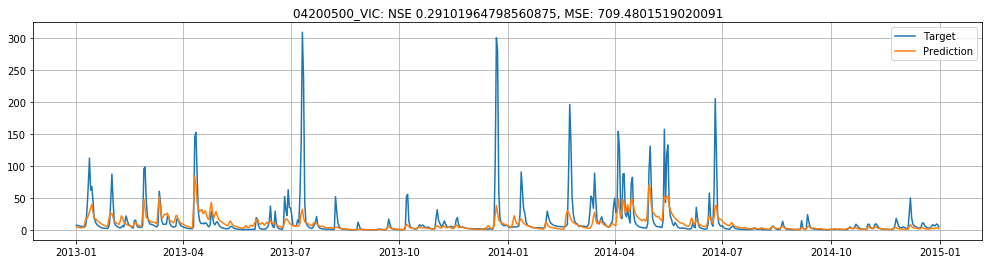

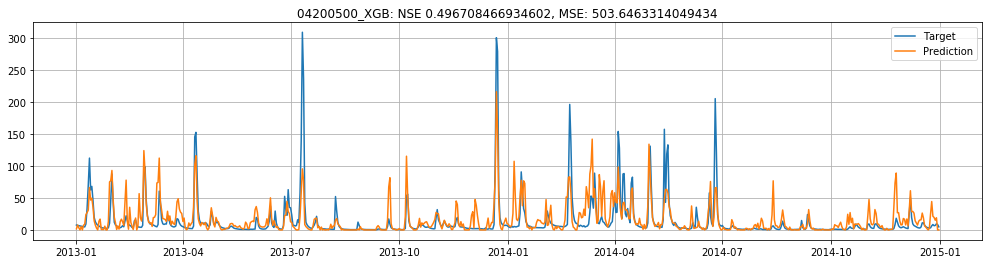

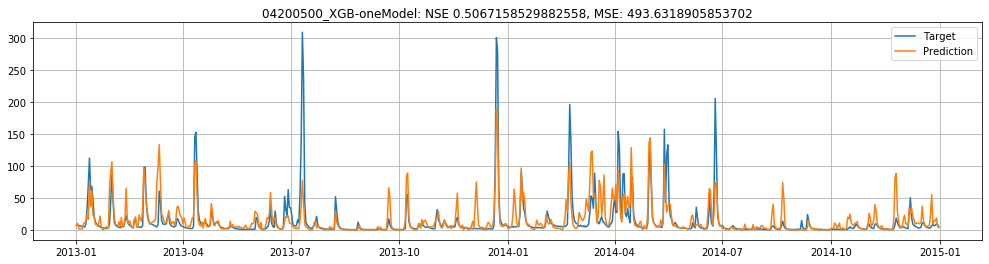

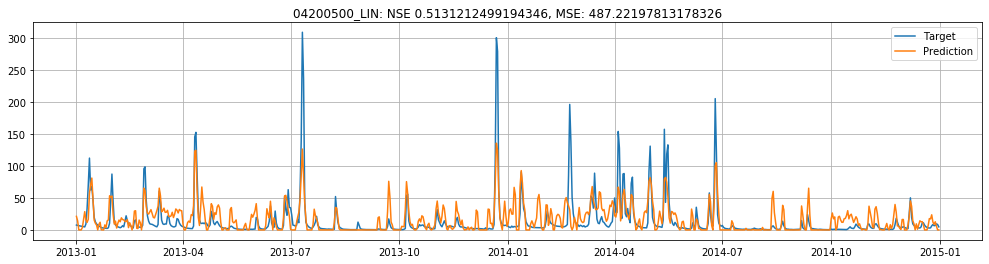

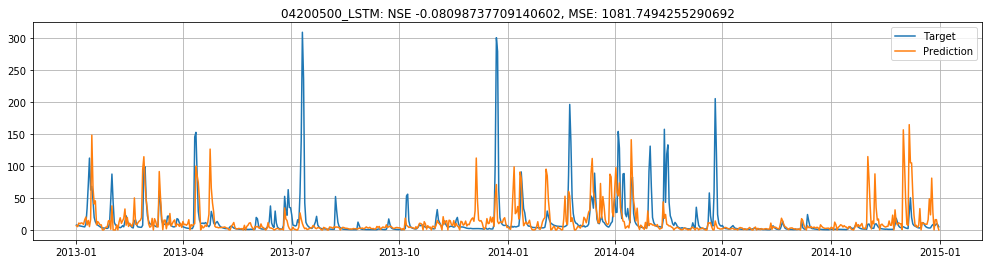

...

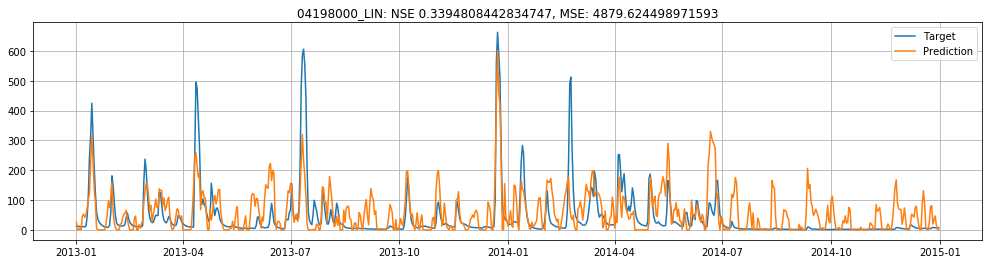

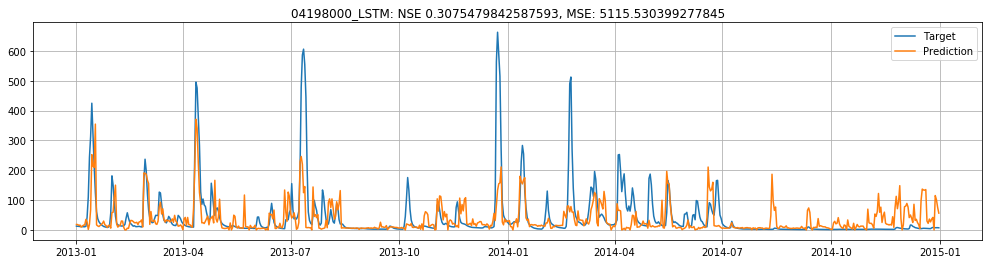

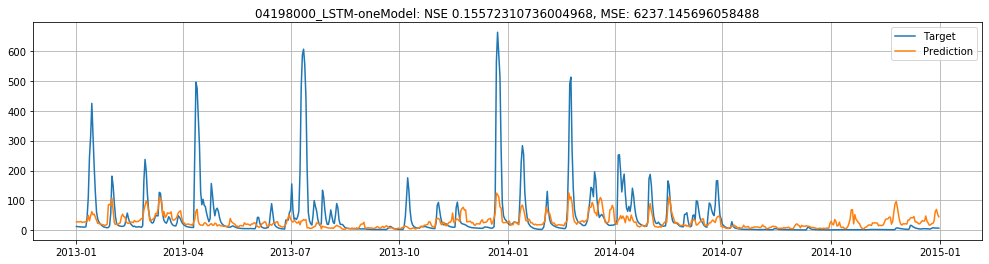

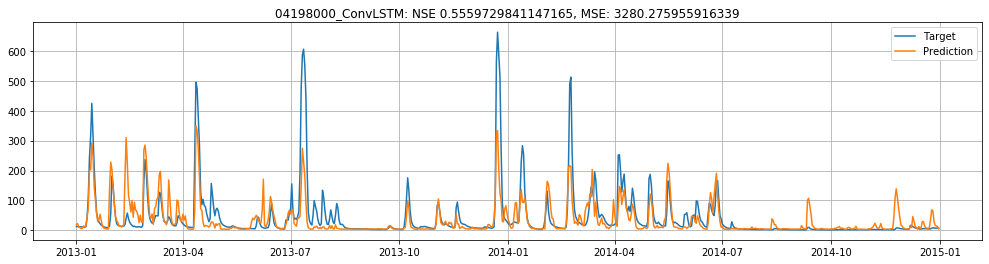

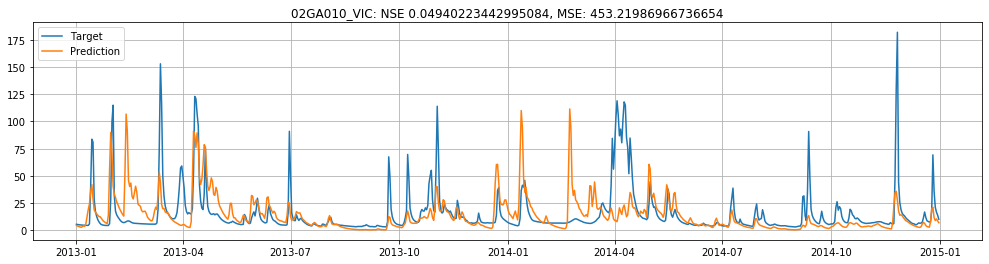

In [ ]:
plot_list = []
vic_nse_list, vic_mse_list = [], []
xgb_nse_list, xgb_mse_list = [], []
xgbone_nse_list, xgbone_mse_list = [], []
lin_nse_list, lin_mse_list = [], []
lstm_nse_list, lstm_mse_list = [], []
lstmone_nse_list, lstmone_mse_list = [], []
convlstm_nse_list, convlstm_mse_list = [], []
xgb_larger, xgb_almost_larger = 0, 0
xgb_outperf = 0
tol = 0.07
for station in data['station'].unique():
    station_data = data[data['station']==station].set_index('date')
    
    vic_nse, vic_mse = evaluate.evaluate_daily(station+'_VIC', station_data[['vic_prediction']], station_data['runoff'], plot=True)
    xgb_nse, xgb_mse = evaluate.evaluate_daily(station+'_XGB', station_data[['xgb_prediction']], station_data['runoff'], plot=True)
    xgbone_nse, xgbone_mse = evaluate.evaluate_daily(station+'_XGB-oneModel', station_data[['xgbone_prediction']], station_data['runoff'], plot=True)
    lin_nse, lin_mse = evaluate.evaluate_daily(station+'_LIN', station_data[['lin_prediction']], station_data['runoff'], plot=True)
    lstm_nse, lstm_mse = evaluate.evaluate_daily(station+'_LSTM', station_data[['lstm_prediction']], station_data['runoff'], plot=True)
    lstmone_nse, lstmone_mse = evaluate.evaluate_daily(station+'_LSTM-oneModel', station_data[['lstmone_prediction']], station_data['runoff'], plot=True)
    convlstm_nse, convlstm_mse = evaluate.evaluate_daily(station+'_ConvLSTM', station_data[['convlstm_prediction']], station_data['runoff'], plot=True)
    vic_nse_list.append(vic_nse)
    vic_mse_list.append(vic_mse)
    xgb_nse_list.append(xgb_nse)
    xgb_mse_list.append(xgb_mse)
    xgbone_nse_list.append(xgbone_nse)
    xgbone_mse_list.append(xgbone_mse)
    lin_nse_list.append(lin_nse)
    lin_mse_list.append(lin_mse)
    lstm_nse_list.append(lstm_nse)
    lstm_mse_list.append(lstm_mse)
    lstmone_nse_list.append(lstmone_nse)
    lstmone_mse_list.append(lstmone_mse)
    convlstm_nse_list.append(convlstm_nse)
    convlstm_mse_list.append(convlstm_mse)
    if xgb_nse > vic_nse:
        xgb_larger += 1
        xgb_outperf += (xgb_nse - lstm_nse)
    if xgb_nse > lstm_nse - tol:
        xgb_almost_larger += 1

print('XGB outperforms LSTM in {} of the stations by {} on average'.format(xgb_larger, xgb_outperf/xgb_larger))
print('XGB almost outperforms LSTM in {} of the stations (tol {})'.format(xgb_almost_larger, tol))
print('VIC Median NSE (clipped to 0)', np.median(vic_nse_list), '/ Min', np.min(vic_nse_list), '/ Max', np.max(vic_nse_list))
print('XGB Median NSE (clipped to 0)', np.median(xgb_nse_list), '/ Min', np.min(xgb_nse_list), '/ Max', np.max(xgb_nse_list))
print('XGB-oneModel Median NSE (clipped to 0)', np.median(xgbone_nse_list), '/ Min', np.min(xgbone_nse_list), '/ Max', np.max(xgbone_nse_list))
print('LIN Median NSE (clipped to 0)', np.median(lin_nse_list), '/ Min', np.min(lin_nse_list), '/ Max', np.max(lin_nse_list))
print('LSTM Median NSE (clipped to 0)', np.median(lstm_nse_list), '/ Min', np.min(lstm_nse_list), '/ Max', np.max(lstm_nse_list))
print('LSTM-oneModel Median NSE (clipped to 0)', np.median(lstmone_nse_list), '/ Min', np.min(lstmone_nse_list), '/ Max', np.max(lstmone_nse_list))
print('ConvLSTM Median NSE (clipped to 0)', np.median(convlstm_nse_list), '/ Min', np.min(convlstm_nse_list), '/ Max', np.max(convlstm_nse_list))

print('VIC Median MSE (clipped to 0)', np.median(vic_mse_list), '/ Min', np.min(vic_mse_list), '/ Max', np.max(vic_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(xgb_mse_list), '/ Min', np.min(xgb_mse_list), '/ Max', np.max(xgb_mse_list))
print('XGB-oneModel Median MSE (clipped to 0)', np.median(xgbone_mse_list), '/ Min', np.min(xgbone_mse_list), '/ Max', np.max(xgbone_mse_list))
print('XGB Median MSE (clipped to 0)', np.median(lin_mse_list), '/ Min', np.min(lin_mse_list), '/ Max', np.max(lin_mse_list))
print('LSTM Median MSE (clipped to 0)', np.median(lstm_mse_list), '/ Min', np.min(lstm_mse_list), '/ Max', np.max(lstm_mse_list))
print('LSTM-oneModel Median MSE (clipped to 0)', np.median(lstmone_mse_list), '/ Min', np.min(lstmone_mse_list), '/ Max', np.max(lstmone_mse_list))
print('ConvLSTM Median MSE (clipped to 0)', np.median(convlstm_mse_list), '/ Min', np.min(convlstm_mse_list), '/ Max', np.max(convlstm_mse_list))

In [ ]:
stations = ['04207200', '04177000', '04166500']#
station_names = ['Tinkers Creek, Bedford, OH', 'Ottawa River, Toledo, OH', 'River Rouge, Detroit, MI']

f, ax = plt.subplots(nrows=len(stations), ncols=1, figsize=(15,5*len(stations)), sharex=True, sharey=True)
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{siunitx}')
plt.rcParams.update({'axes.titlesize': 'x-large',
                     'axes.labelsize': 'x-large',
                     'legend.fontsize': 'x-large',
                     'xtick.labelsize':'x-large',
                     'ytick.labelsize':'x-large'})
i = 0
for station in stations:
    station_data = data[data['station']==station].set_index('date')
    station_data = station_data.loc['2013':'2014']

    vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
    xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
    lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)
    print(station, 'VIC:', vic_nse, 'XGB:', xgb_nse, 'Ridge:', lin_nse)

    ax[i].plot(range(len(station_data)), (station_data['vic_prediction'].clip(0) - station_data['runoff']), label='VIC-GRU'.format(vic_nse), color='#bb4d4c')
    ax[i].plot(range(len(station_data)), (station_data['lin_prediction'].clip(0) - station_data['runoff']), label='Ridge'.format(lin_nse), color='#92a24e')
    ax[i].plot(range(len(station_data)), (station_data['xgb_prediction'].clip(0) - station_data['runoff']), label='XGBoost'.format(xgb_nse), color='#9061ae')
    ax[i].grid()
    l = ax[i].legend(ncol=3, loc='lower right', frameon=False, columnspacing=2)

    dates = pd.Series(pd.date_range('2013-01-01', '2015-01-01', freq='D'))
    xticks = dates[dates.dt.day==1][::3]
    ax[i].set_xticks(xticks.index.values)
    ax[i].set_xticklabels(xticks.dt.strftime('%Y-%m').values, rotation=0)
    ax[i].set_ylabel('$\hat{y}_t^S - y_t^S$ [\si{\cubic\metre\per\second}]')
    
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['bottom'].set_visible(False)
    ax[i].spines['left'].set_visible(False)
    
    i += 1

for i in range(len(stations)):
    extent = ax[i].get_tightbbox(f.canvas.get_renderer()).transformed(f.dpi_scale_trans.inverted())
    ax[i].set_title('Station {}: {}'.format(stations[i], station_names[i]))
    plt.savefig('../../figures/{}_vic-gru_xgboost{}_linreg{}_2014.pdf'.format(stations[i], xgb_file, lin_file), bbox_inches=extent.expanded(1.01,1.2))

In [ ]:
print(pd.DataFrame([vic_nse_list, lin_nse_list, xgb_nse_list, xgbone_nse_list, lstm_nse_list, lstmone_nse_list, convlstm_nse_list], index=['VIC-GRU', 'Ridge', 'XGBoost', 'XGBoost-oneModel', 'LSTM', 'LSTM-oneModel', 'ConvLSTM']).transpose().describe())

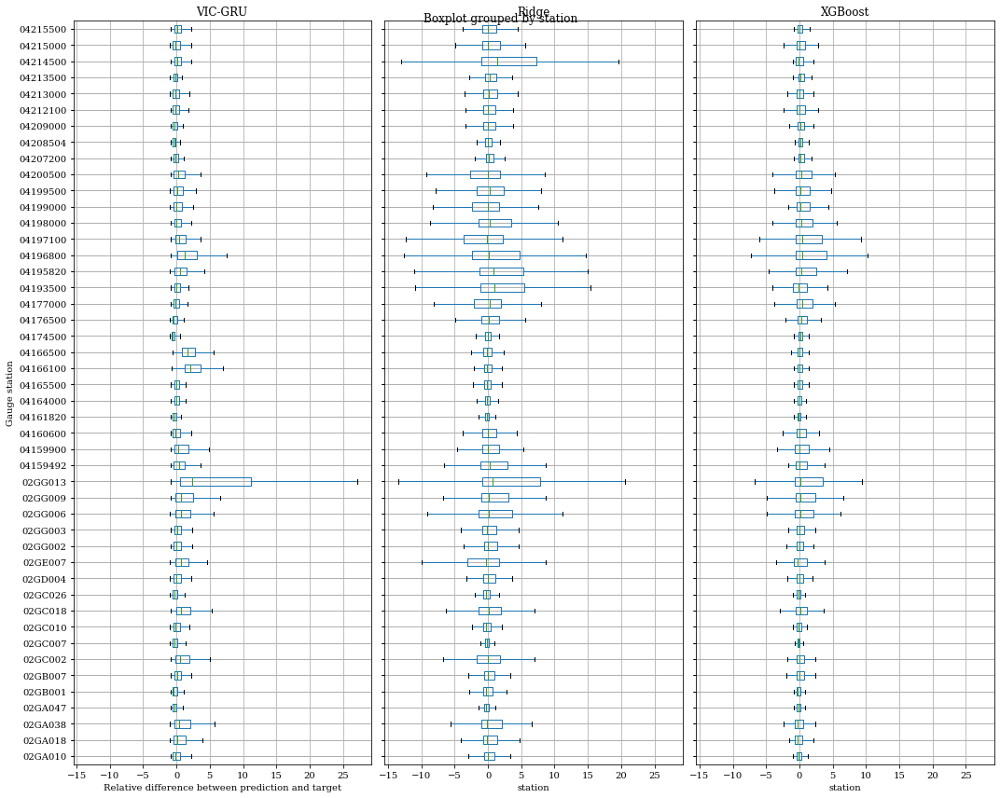

In [20]:
a = data.copy()
a['VIC-GRU'] = (a['vic_prediction'] - a['runoff']) / a['runoff']
a['Ridge'] = (a['lin_prediction'] - a['runoff']) / a['runoff']
a['XGBoost'] = (a['xgb_prediction'] - a['runoff']) / a['runoff']
f1, f2, f3 = a.boxplot(by='station', column=['VIC-GRU', 'Ridge', 'XGBoost'], showfliers=False, vert=False, figsize=(15,12), layout=(1,3))
f1.set_xlabel('Relative difference between prediction and target')
f1.set_ylabel('Gauge station')  
plt.tight_layout()

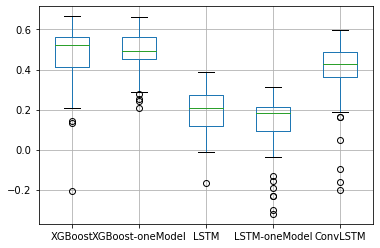

In [19]:
#pd.DataFrame([vic_nse_list, lin_nse_list, xgb_nse_list, xgbone_nse_list, lstm_nse_list, lstmone_nse_list, convlstm_nse_list], index=['VIC-GRU', 'Ridge', 'XGBoost', 'XGBoost-oneModel', 'LSTM', 'LSTM-oneModel', 'ConvLSTM']).transpose().boxplot()
pd.DataFrame([xgb_nse_list, xgbone_nse_list, lstm_nse_list, lstmone_nse_list, convlstm_nse_list], index=['XGBoost', 'XGBoost-oneModel', 'LSTM', 'LSTM-oneModel', 'ConvLSTM']).transpose().boxplot()

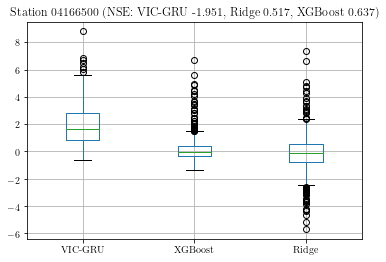

In [18]:
station = '04166500'

f = plt.figure()
station_data = data[data['station']==station].set_index('date')

vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
lin_nse, _ = evaluate.evaluate_daily(station, station_data[['lin_prediction']], station_data['runoff'], plot=False)

plt.title('Station {} (NSE: VIC-GRU {:.3f}, Ridge {:.3f}, XGBoost {:.3f})'.format(station, vic_nse, lin_nse, xgb_nse))
f = pd.DataFrame([(station_data['vic_prediction'] - station_data['runoff'])/station_data['runoff'], 
                  (station_data['xgb_prediction'] - station_data['runoff'])/station_data['runoff'], 
                  (station_data['lin_prediction'] - station_data['runoff'])/station_data['runoff']], 
                 index=['VIC-GRU', 'XGBoost', 'Ridge']).transpose().boxplot()

04166500 VIC: -1.950562477912738 XGB: 0.63735570226305
04177000 VIC: 0.33416001234153936 XGB: 0.1314257288053211
04166500 VIC: -1.950562477912738 XGB: 0.63735570226305


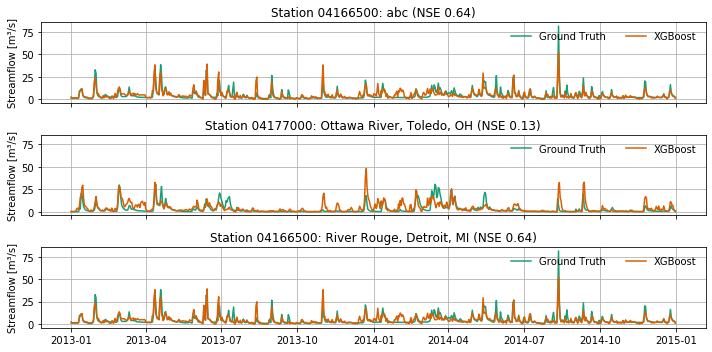

In [24]:
stations = ['04166500', '04177000', '04166500']
station_names = ['abc', 'Ottawa River, Toledo, OH', 'River Rouge, Detroit, MI']
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(10,5), sharex=True, sharey=True)
i = 0
for station in stations:
    station_data = data[data['station']==station].set_index('date')
    station_data = station_data[(station_data.index >= '2010-01-01') & (station_data.index <= '2014-12-31')]

    vic_nse, _ = evaluate.evaluate_daily(station, station_data[['vic_prediction']], station_data['runoff'], plot=False)
    xgb_nse, _ = evaluate.evaluate_daily(station, station_data[['xgb_prediction']], station_data['runoff'], plot=False)
    print(station, 'VIC:', vic_nse, 'XGB:', xgb_nse)

    ax[i].set_title('Station {}: {} (NSE {:.2f})'.format(station, station_names[i], xgb_nse))
    ax[i].plot(station_data.index, station_data['runoff'].clip(0), label='Ground Truth', color='#1b9e77')#8960b3')
    ax[i].plot(station_data.index, station_data['xgb_prediction'].clip(0), label='XGBoost', color='#d95f02')#61ad65')
    ax[i].grid()
    l = ax[i].legend(ncol=3, loc='upper right', frameon=False, columnspacing=2)

    dates = pd.Series(pd.date_range('2010-01-01', '2015-01-01', freq='D'))
    ax[i].set_ylabel('Streamflow [m³/s]')
    i += 1
plt.tight_layout()
plt.savefig('../../figures/{}_xgboost{}_2014.png'.format('-'.join(stations), xgb_file), bbox_inches='tight', dpi=300)